In [106]:
import pandas as pd
import numpy as np
import river

link = '../Datasets/hit400Dataset.csv'
df = pd.read_csv(link)

df.columns


#df = df['account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type','label']

Index(['amount', 'account_age', 'holder_age', 'account_balance',
       'transaction_time', 'entry_type', 'gender', 'broswer', 'avs', 'cvv',
       'connection_type', 'card_number', 'account_type', 'location', 'bank',
       'label'],
      dtype='object')

In [5]:
from river import synth
from river import ensemble
from river import evaluate
from river import metrics

dataset = synth.ConceptDriftStream(seed=42, position=500,
                                    width=40).take(1000)

model = ensemble.AdaptiveRandomForestClassifier(
     n_models=3,
     seed=42
)

metric = metrics.Accuracy()

evaluate.progressive_val_score(df, model, metric)


ValueError: too many values to unpack (expected 2)

In [8]:
import pandas as pd
from river import stream

X= df.drop('label', axis=1)
y = df['label']

from river import compose

pp = compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder()

for xi, yi in stream.iter_pandas(X, y):
    pp = pp.learn_one(xi)
    print(pp.transform_one(xi))
    


{'gender_female': 1, 'broswer_Mozilla/5.0': 1, 'account_type_debit': 1, 'bank_First Capital Bank': 1, 'avs_n': 1, 'connection_type_https': 1, 'entry_type_magnetic strip': 1, 'location_Bulawayo': 1}
{'gender_female': 0, 'gender_male': 1, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'account_type_debit': 1, 'bank_First Capital Bank': 0, 'bank_Agribank': 1, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Bulawayo': 0, 'location_Harare': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_lk/41.0.2272.89': 1, 'account_type_debit': 1, 'bank_First Capital Bank': 0, 'bank_Agribank': 0, 'bank_Steward Bank': 1, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'location_Bulawayo': 1, 'location_Harare': 0}
{'gender_female': 1, 'gender_male': 0,

{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 1, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 1, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 1, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 1, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 1, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 1, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 1, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 1, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 1, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_de

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 1, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 1, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 1, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 1, 'bank_Agribank': 0, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 1, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 1, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 1, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 1, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 1, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_de

{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 1, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 1, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 1, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 1, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 1, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 1, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 1, 'bank_Agribank': 0, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 1, 'account_type_credit': 1, 'account_type_deb

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 1, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 0, 'entry_type_chip': 1, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 1, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_de

{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 1, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 1, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 1, 'connection_type_http': 0, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 1, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 1, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 1, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 1, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 1, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 0}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 1, 'bank_First Capital Bank': 0, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 1, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_deb

{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_debit': 1, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 1, 'bank_CBZ Bank': 0, 'avs_y': 1, 'avs_n': 0, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 1, 'entry_type_online': 0, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

{'gender_female': 1, 'gender_male': 0, 'broswer_AppleWebKit/537.36': 1, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 0, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 1, 'account_type_debit': 0, 'bank_FBC Bank': 0, 'bank_Steward Bank': 0, 'bank_BANC ABC': 0, 'bank_Agribank': 0, 'bank_First Capital Bank': 1, 'bank_CBZ Bank': 0, 'avs_y': 0, 'avs_n': 1, 'connection_type_https': 0, 'connection_type_http': 1, 'entry_type_magnetic strip': 0, 'entry_type_online': 1, 'entry_type_chip': 0, 'location_Hwange': 0, 'location_Bindura': 0, 'location_Harare': 0, 'location_Rusape': 0, 'location_Kwekwe': 0, 'location_Marondera': 0, 'location_Gweru': 0, 'location_Bulawayo': 1}
{'gender_female': 0, 'gender_male': 1, 'broswer_AppleWebKit/537.36': 0, 'broswer_lk/41.0.2272.89': 0, 'broswer_Chrome/41.0.2272.89': 0, 'broswer_Mozilla/5.0': 1, 'broswer_Safari/537.36': 0, 'broswer_Linux x86_64': 0, 'account_type_credit': 0, 'account_type_deb

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [52]:
from river import linear_model
from river import metrics
from river import tree
from river import neighbors

metric = metrics.ROCAUC()
X= df.drop('label', axis=1)
y = df['label']

model1 = linear_model.LogisticRegression()
model2 = ensemble.AdaptiveRandomForestClassifier(
     n_models=3,
     seed=42
)

model3 = ensemble.AdaBoostClassifier(
     model=(
         tree.HoeffdingTreeClassifier(
             split_criterion='gini',
             split_confidence=1e-5,
             grace_period=2000
         )
     ),
     n_models=5,
     seed=42
)

model4 = neighbors.KNNClassifier()

model5 =  linear_model.ALMAClassifier() 

metric = metrics.ROCAUC()

for  xi, yi in stream.iter_pandas(X, y):
    #y_pred1 = model1.predict_proba_one(xi)
    #y_pred2 = model2.predict_proba_one(xi)
    #y_pred3 = model3.predict_proba_one(xi)
    y_pred4 = model4.predict_proba_one(xi)
    #y_pred5 = model5.predict_proba_one(xi)
    
    model1.learn_one(xi, yi)
    model2.learn_one(xi, yi)
    #model3.learn_one(xi, yi)
    model4.learn_one(xi, yi)
    #model5.learn_one(xi, yi)
    
    #met1 = metric.update(yi, y_pred1)
    #met2 = metric.update(yi, y_pred2)
    #met3 = metric.update(yi, y_pred3)
    met4 = metric.update(yi, y_pred4)
    #met5 = metric.update(yi, y_pred5)
    
    stats  = {
    #    'LogisticRegression':met1,
     #   'Adaptive Random Forest Classifier':met2,
    #    'AdaBoostClassifier':met3,
        'KNN Classifier':met4,
    #    'ALMAClassifier':met5
    }

stats

TypeError: can't multiply sequence by non-int of type 'float'

In [81]:
from river import compose
from river import preprocessing
from river import linear_model
from river import metrics
from river import tree
from river import neighbors

model1 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    ensemble.AdaptiveRandomForestClassifier(
     n_models=3,
     seed=42
)
)


model2 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    linear_model.LogisticRegression()
)


model3 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    ensemble.AdaBoostClassifier(
     model=(
         tree.HoeffdingTreeClassifier(
             split_criterion='gini',
             split_confidence=1e-5,
             grace_period=2000
         )
     ),
     n_models=5,
     seed=42
)

)

model4 = compose.Pipeline(
    compose.Select('account_type','location','bank','connection_type','broswer','avs', 'gender','entry_type') | river.preprocessing.OneHotEncoder(),
    preprocessing.StandardScaler(),
    linear_model.ALMAClassifier() 
)

models = {
    'Adaptive Random Forest Classifier':model1, 
    'LogisticRegression':model2, 
    'AdaBoostClassifier':model3, 
    'ALMA Classifier':model4
}




ValueError: too many values to unpack (expected 2)

In [105]:
from river import compose
from river import preprocessing
from river import linear_model
from river import metrics
from river import tree
from river import neighbors

metric = metrics.ROCAUC()
models = {
    'Adaptive Random Forest Classifier':model1, 
    'LogisticRegression':model2, 
    'AdaBoostClassifier':model3, 
    'ALMA Classifier':model5
}
#models = [model1, model2, model3, model5]

X= df.drop('label', axis=1)
y = df['label']
stats = {}

for i, (name, model) in enumerate(models.items()):
    for xi, yi in stream.iter_pandas(X, y):
        y_pred = model.predict_proba_one(xi)
        model.learn_one(xi, yi)
        met = metric.update(yi, y_pred)    
    print(name)
    print('Accuracy Score:>',met)
    metric = metrics.ROCAUC()
    print('-------------------------------------------------------------')

Adaptive Random Forest Classifier
Accuracy Score:> ROCAUC: 0.999946
-------------------------------------------------------------
LogisticRegression
Accuracy Score:> ROCAUC: 0.517681
-------------------------------------------------------------
AdaBoostClassifier
Accuracy Score:> ROCAUC: 0.70847
-------------------------------------------------------------
ALMA Classifier
Accuracy Score:> ROCAUC: 0.502984
-------------------------------------------------------------


In [95]:


stats = {
    'Adaptive Random Forest Classifier':0.882, 
    'LogisticRegression':0.6977, 
    'AdaBoostClassifier':0.6395, 
    'ALMA Classifier':0.6115
}

In [96]:
stats

{'Adaptive Random Forest Classifier': 0.882,
 'LogisticRegression': 0.6977,
 'AdaBoostClassifier': 0.6395,
 'ALMA Classifier': 0.6115}

In [97]:
#creating a table of classifiers and thier accuracy
ca = [[a,b] for a,b in stats.items()]
ca = pd.DataFrame(ca, columns=['Classifier','Accuracy'])
ca

,Classifier,Accuracy
0,Adaptive Random Forest Classifier,0.8820
1,LogisticRegression,0.6977
2,AdaBoostClassifier,0.6395
3,ALMA Classifier,0.6115


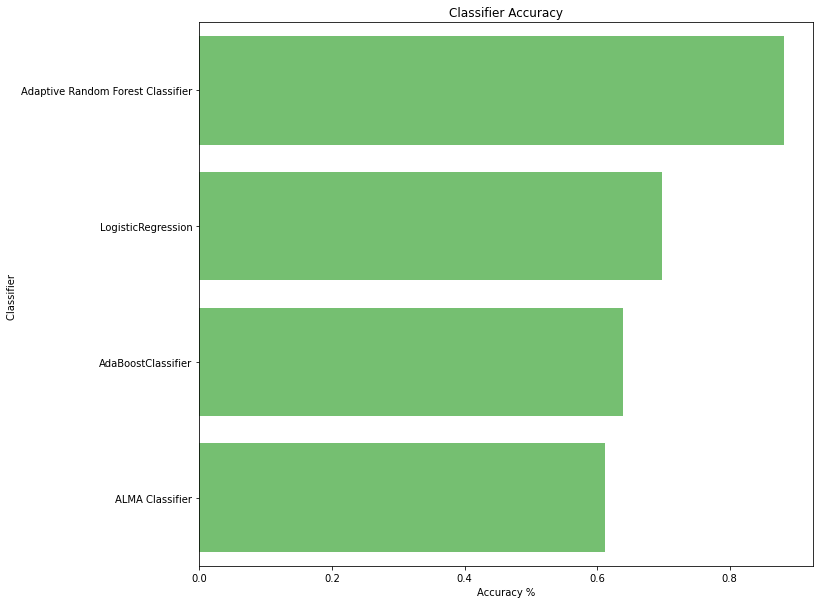

In [101]:
#plotting classifiers and thier accuracy
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import  rcParams
rcParams['figure.figsize'] = 11,10

sns.set_color_codes('muted')
sns.barplot(x='Accuracy', y='Classifier', data=ca, color='g')
plt.xlabel('Accuracy %')
plt.ylabel('Classifier ')
plt.title('Classifier Accuracy')
plt.show()


In [39]:
from pprint import pprint
import random
import string

random.seed(4)
alphabet = list(string.ascii_lowercase)
X = [
     {
         'c1': random.choice(alphabet),
         'c2': random.choice(alphabet),
     }
     for _ in range(4)
 ]
pprint(X)
X = pd.read_csv('tv_shows.csv')
X = X.to_dict()
X

[{'c1': 'h', 'c2': 'j'},
 {'c1': 'd', 'c2': 'x'},
 {'c1': 'm', 'c2': 'p'},
 {'c1': 'e', 'c2': 'c'}]


{'gender': {0: 'male', 1: 'female', 2: 'male', 3: 'female', 4: 'male'},
 'age': {0: 2016, 1: 2006, 2: 2001, 3: 2008, 4: 2019},
 'worth': {0: 9.5, 1: 9.4, 2: 9.4, 3: 9.4, 4: 9.4}}

In [38]:
import river.preprocessing

oh = river.preprocessing.OneHotEncoder(sparse=True)
for x in X:
     oh = oh.learn_one(x)
     pprint(oh.transform_one(x))


AttributeError: 'str' object has no attribute 'items'

In [33]:
from river import compose

pp = compose.Select('c1') | river.preprocessing.OneHotEncoder()

for x in X:
     pp = pp.learn_one(x)
     pprint(pp.transform_one(x))


{'c1_h': 1}
{'c1_d': 1, 'c1_h': 0}
{'c1_d': 0, 'c1_h': 0, 'c1_m': 1}
{'c1_d': 0, 'c1_e': 1, 'c1_h': 0, 'c1_m': 0}
